# GG4257 - Urban Analytics: A Toolkit for Sustainable Urban Development
## Lab Assignment No 1 : Handling and GeoVisualisation of Urban Data

# Assignment Instructions

For this assignment, you are required to create a **report** that includes your approach to the challenges presented in practical **Labs 5, 6, and 7**. The report should be in the form of a **Jupyter Notebook** and should contain a **GitHub repository** where all the code used can be replicated to achieve the same results. You can use the same repository you shared during Assignment No 1, but describe where the new labs will be included. 

**General Considerations:**

1. Include the coursework cover page available in the Virtual Office as the initial section of your report, with all relevant information and the GitHub repository link, but exclude the word count.  
   
2. You can structure your report as you prefer, but try to be consistent, organized and clear. You can use the same repository you shared during Assignment No 1, but describe where the new labs will be included. 
   
3. To avoid exceeding the size limit of a GitHub repository, it may not be possible to push a notebook containing all outcomes. To address this issue, please include a screenshot of the last outcome of each challenge using the description cells in the notebook. Once included, clear all outcomes to reduce the notebook's size. I will reproduce the code and compare the images you provided with the outcomes I obtained while running your code to ensure that I get the same results.
  
4. Once again, you can structure this report in any way you want. Creating another creates a single, large notebook with multiple sections, or you can follow the nested notebook with folders structure I provided during the last Assigment. There will be marks given for the structure, coherence, consistency, and clarity of your report 
   
5. **Descriptions and Coding Comments**: Each code cell should have comments that describe what the code is doing, any issues or barriers, citations, and other relevant information. Use markdown cells where you explain the problem you are addressing and how you did it (here, you can add *screenshots* from the final outcomes). Some challenges only require you to answer questions and provide insights. This will help the marker evaluate your understanding of the code, the outcomes, and the  problem you have solved.
   
6. **Data**: As you already know, the challenges usually come with data. Once again, ensure you add a clear restructure and description on how to get large data or any data you can't push into the repo. For larger datasets, you can state that the data will be available in a public folder such as *Google Drive* or *One Drive*. Then, provide instructions on where to add or locate the data to replicate the results properly.

   >It is your responsibility to ensure the reproducibility of the repo and notebook. Make sure everything is clearly described and available. This is a typical workflow for most spatial data science projects, particularly in urban analytics.

8. The length of the report is not restricted, as you may need screenshots, descriptions, and code.
   
# Example of report structure and the challenges that must be included.

- Cover Page
- Introduction  - How to replicate the code and get the required data
- Lab No 5: Intro to Networks - 2 Challenges
- Lab No 6: Geodemographics: 1 Challenges
- Lab No 7: Spatial Microsimulation: 3 Challenges
- Final Remarks(limitations, barriers, and any additional comments)


# Cover Page
## Student ID: 200024980
## Module Code: GG4257
## Module Title: Urban Analytics: A Toolkit for Sustainable Urban Development
## Assignment: Labs 5-7 and Proposal 
## Degree Programme: International Relations and Geography 
## Deadline Date: 
In submitting this assignment I hereby confirm that

I have read the University's statement on Good Academic Practice; that the following work is my own work; and that significant academic debts and borrowings have been properly acknowledged and referenced.


# Introduction
This section introduces how to replicate the code and how to get the required data. 

All the data required to run this notebook locally will be placed in a Google Drive folder. In addition, screenshots of essential maps and graphs will be included in this folder and accessed throughout the notebook to save processing time.

Moreover, the notebook will also be published on my Github Repo under the Assignment 1 folder. In case you would like to run this locally, I will also upload the environment file (.yml) to the repo, as well as the link to the Google Drive folder in the read me file.

In the script below, all the paths to the data assume that the file is in a folder called 'data'. 

## [Google Drive Folder with Data](https://drive.google.com/drive/folders/13wSOHnQqmqMQAJ4uYTk5HldfkwJNOs0b?usp=drive_link)
## [My Github Repo](https://github.com/issyollie/UARepo)

# Lab No. 5: Intro to Networks

## Challenge 1
It's time for you to apply everything you learned by analyzing a case study of GitHub's collaborator network data.

- **Data**: `github_users.p` (avaliable in Moodle)

> This dataset is a GitHub user collaboration network. As you already know, GitHub is a social coding site where users can collaborate on code repositories. In this network, nodes are users, and edges indicate that two users are collaborators on at least one GitHub repository.

1. Read the GitHub network dataset.
2. Describe using the basic functions of the graph's size. Explore nodes and edges. Provide how many nodes and edges are present in the network
3. Calculate the **degree centrality** of the GitHub collaboration network G. Using the .values() method of the network (e.g. G), extract the degree centrality values and convert them into a list. Then, plot a histogram to visualize the distribution of node degrees in the network.
4. Make a subset of the initial network (e.g. Gh_sub), where you include at least five nodes and their corresponding edges. Experiment with multiple nodes so you have a graph with enough edges to work on.
5. Plot the subset graph created.
6. Now calculate another relevant measure of the network -- **betweenness centrality**. Plot the betweenness centrality distribution of the subset you created. Tip: Same steps from the previous step, but use `nx.betweenness_centrality()`
7. Plot the Matrix, Arc and Circos from the subset.

### 1. Reading the GitHub network dataset 

In [19]:
import os 

In [20]:
os.getcwd()

'/Users/Isaiah/Documents/UA_Repo/Assignment 2/data'

In [24]:
os.chdir ('/Users/Isaiah/Documents/UA_Repo/Assignment 2')

In [26]:
import pickle

with open('data/github_users.p', 'rb') as x:
    git = pickle.load(x)
git

### 2. Describing the data
Describe using the basic functions of the graph's size. Explore nodes and edges. Provide how many nodes and edges are present in the network

In [27]:
print(len(git))# Returns the size of the graph `T`, 
print(type(git.nodes())) # Returns the type of `T.nodes()`
print(list(git.edges(data=True))[-1]) # Reads the attributes associated with the last element of the edges list. 
print(list(git.nodes(data=True))[0]) # Reads the attributes associated with the firts element of the node list.
print(type(list(git.edges(data=True))[-1][2])) # Provides the type of data 

56519
<class 'networkx.classes.reportviews.NodeView'>
('u10898', 'u10901', {})
('u1', {'bipartite': 'users'})
<class 'dict'>


Looks like the graph is over 56,000 entries in size. Now, let's try to see how many nodes and edges there are. 

In [28]:
# Here, I can use .edges/.nodes and len() to print the number of nodes and edges 
print(len(list(git.edges)))
print(len(list(git.nodes)))

72900
56519


In [29]:
# The outcome of this is extremely large - it's all the connections between users in the data. 
list(git.edges)

[('u1', 'u3124'),
 ('u1', 'u1814'),
 ('u1', 'u5888'),
 ('u1', 'u9483'),
 ('u1', 'u1527'),
 ('u1', 'u9271'),
 ('u1', 'u8196'),
 ('u1', 'u2653'),
 ('u1', 'u4534'),
 ('u1', 'u2253'),
 ('u1', 'u127'),
 ('u1', 'u3071'),
 ('u1', 'u3166'),
 ('u2', 'u9346'),
 ('u3', 'u2688'),
 ('u3', 'u5814'),
 ('u3', 'u1511'),
 ('u3', 'u719'),
 ('u3', 'u3681'),
 ('u3', 'u7940'),
 ('u3', 'u958'),
 ('u3', 'u8059'),
 ('u3', 'u1764'),
 ('u3', 'u5496'),
 ('u3', 'u3426'),
 ('u3', 'u204'),
 ('u3', 'u6701'),
 ('u3', 'u3117'),
 ('u3', 'u409'),
 ('u3', 'u4390'),
 ('u3', 'u1879'),
 ('u3', 'u6118'),
 ('u3', 'u7195'),
 ('u3', 'u6'),
 ('u3', 'u2823'),
 ('u3', 'u1608'),
 ('u3', 'u8480'),
 ('u3', 'u2593'),
 ('u3', 'u5207'),
 ('u3', 'u1937'),
 ('u3', 'u3467'),
 ('u3', 'u1054'),
 ('u3', 'u3610'),
 ('u3', 'u307'),
 ('u3', 'u7765'),
 ('u3', 'u1679'),
 ('u3', 'u8946'),
 ('u3', 'u5741'),
 ('u3', 'u1666'),
 ('u3', 'u816'),
 ('u3', 'u2094'),
 ('u3', 'u1890'),
 ('u3', 'u6984'),
 ('u3', 'u1748'),
 ('u3', 'u115'),
 ('u3', 'u10788'),
 (

There are 72900 edges and 56519 nodes. This suggests that some nodes have multiple connections, which could be a sign that this is best represented by a multi-directional graph. However, at this point, I'm not yet sure if the relationship is directional or not. 

### 3. Degree Centrality
Calculate the **degree centrality** of the GitHub collaboration network G. Using the .values() method of the network (e.g. G), extract the degree centrality values and convert them into a list. Then, plot a histogram to visualize the distribution of node degrees in the network.

In [31]:
import networkx as nx
import matplotlib.pyplot as plt
nx.number_of_selfloops(git)
# There are no self-loops, which makes sense, considering the structure of Github

0

In [32]:
# Creating an empty graph called git_network
git_network = nx.Graph()
git_network.add_edges_from(git.edges) # Adding the edges from git.edges

# This line here calculates the degree centrality for all the notes in "git" and stores them in a dictionary (called degree-centrality)
degree_centrality = nx.degree_centrality(git_network)

# Extracting degree centrality values as a list
centrality_list = list(degree_centrality.values())

# Print the degree centrality list
print(centrality_list) # This outcome is quite long, as a note. 

[0.002224123182207015, 0.002224123182207015, 0.006330196749358427, 0.005474764756201882, 0.002224123182207015, 0.004790419161676647, 0.002224123182207015, 0.007869974337040207, 0.0023952095808383233, 0.009238665526090676, 0.002224123182207015, 0.007185628742514971, 0.0070145423438836615, 0.00427715996578272, 0.00017108639863130882, 0.00017108639863130882, 0.017964071856287428, 0.02035928143712575, 0.016766467065868266, 0.016766467065868266, 0.05218135158254919, 0.01899059024807528, 0.016766467065868266, 0.016766467065868266, 0.016766467065868266, 0.016766467065868266, 0.016766467065868266, 0.023952095808383235, 0.026689478186484178, 0.029940119760479045, 0.002737382378100941, 0.019503849443969205, 0.0013686911890504706, 0.0174508126603935, 0.0013686911890504706, 0.024465355004277163, 0.024465355004277163, 0.028913601368691193, 0.016766467065868266, 0.016766467065868266, 0.016766467065868266, 0.016766467065868266, 0.024465355004277163, 0.016766467065868266, 0.019332763045337896, 0.02480

<function matplotlib.pyplot.show(close=None, block=None)>

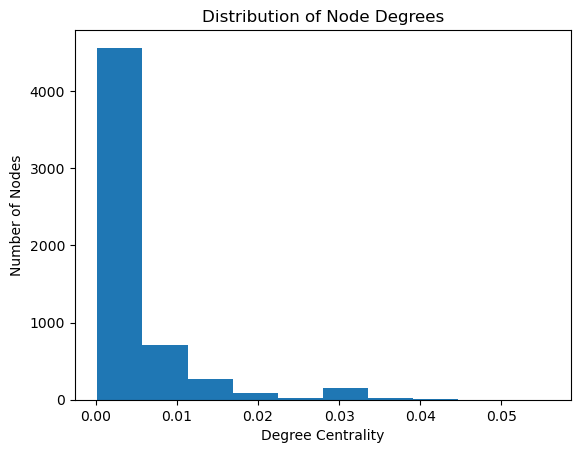

In [33]:
# I can use .hist to create a histogram based on the matplotlib library. 
plt.hist(centrality_list, bins=10) 

# Setting labels and title
plt.xlabel("Degree Centrality")
plt.ylabel("Number of Nodes")
plt.title("Distribution of Node Degrees")
plt.show

It looks like most nodes have a very low degree centrality. Fewer than a thousand have around a 0.01 centrality. Very few have over 0.03 degree centrality. 

### 4. Subsetting the data 
Make a subset of the initial network (e.g. Gh_sub), where you include at least five nodes and their corresponding edges. Experiment with multiple nodes so you have a graph with enough edges to work on.

In [48]:
subset_from_git=git.edges(['u264','u233', 'u9965', 'u42000', 'u55', 'u7534'], data=True) # I chose these at random. 
subset_from_git

EdgeDataView([('u264', 'u6', {}), ('u264', 'u38', {}), ('u264', 'u44', {}), ('u264', 'u48', {}), ('u264', 'u64', {}), ('u264', 'u89', {}), ('u264', 'u102', {}), ('u264', 'u161', {}), ('u264', 'u183', {}), ('u264', 'u195', {}), ('u264', 'u7138', {}), ('u264', 'u6395', {}), ('u264', 'u6607', {}), ('u264', 'u4815', {}), ('u264', 'u2287', {}), ('u264', 'u4631', {}), ('u264', 'u5851', {}), ('u264', 'u10180', {}), ('u264', 'u5948', {}), ('u264', 'u2546', {}), ('u264', 'u4980', {}), ('u264', 'u4565', {}), ('u264', 'u922', {}), ('u264', 'u1091', {}), ('u264', 'u8575', {}), ('u264', 'u10607', {}), ('u264', 'u7861', {}), ('u264', 'u4495', {}), ('u264', 'u466', {}), ('u264', 'u2317', {}), ('u264', 'u1336', {}), ('u264', 'u2557', {}), ('u264', 'u1560', {}), ('u264', 'u6342', {}), ('u264', 'u5123', {}), ('u264', 'u2107', {}), ('u264', 'u1705', {}), ('u264', 'u7322', {}), ('u264', 'u1230', {}), ('u264', 'u5695', {}), ('u264', 'u3359', {}), ('u264', 'u2251', {}), ('u264', 'u1873', {}), ('u264', 'u202

In [49]:
#Creating an empty graph, then adding in the data
git_sub = nx.DiGraph()
git_sub.add_edges_from(subset_from_git) #Adding the list from the subset of nodes.
len(git_sub)

463

### 5. Plot the subset graph created.

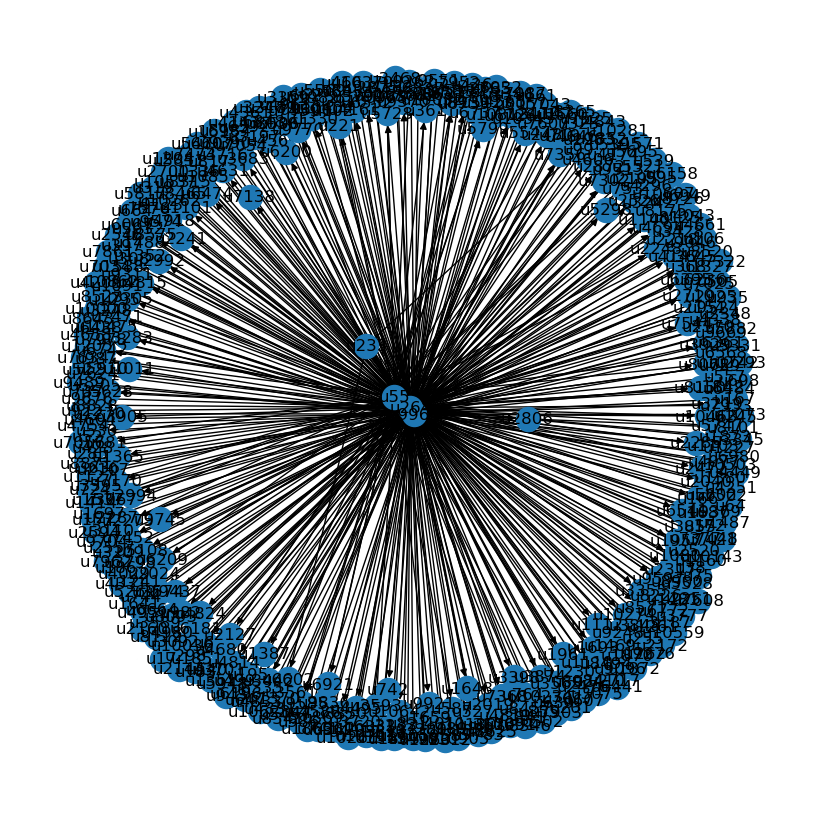

In [38]:
plt.figure(figsize=(8, 8))
nx.draw(git_sub, with_labels=True)
plt.show()

### 6. Calculating betweenness centrality
Now calculate another relevant measure of the network -- **betweenness centrality**. Plot the betweenness centrality distribution of the subset you created. Tip: Same steps from the previous step, but use `nx.betweenness_centrality()`

In [39]:
# Creating an empty graph called git_network
git_network_subset = nx.Graph()
git_network_subset.add_edges_from(subset_from_git) # Adding the edges from git.edges

# This line here calculates the betweenness centrality for all the notes in "git" and stores them in a dictionary (called betweenness list)
betweenness_centrality = nx.betweenness_centrality(git_network_subset)

# Extracting degree centrality values as a list
betweenness_list = list(betweenness_centrality.values())

# Print the degree centrality list
#print(betweenness_list) # This outcome is quite long, as a note. 


<function matplotlib.pyplot.show(close=None, block=None)>

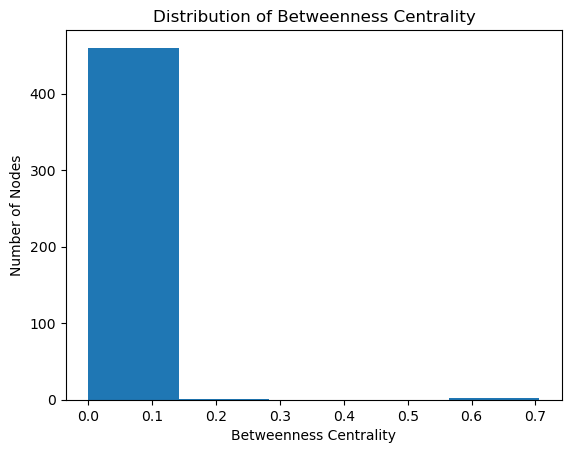

In [40]:
# I can use .hist to create a histogram based on the matplotlib library. 
plt.hist(betweenness_list, bins=5) 

# Setting labels and title
plt.xlabel("Betweenness Centrality")
plt.ylabel("Number of Nodes")
plt.title("Distribution of Betweenness Centrality")
plt.show

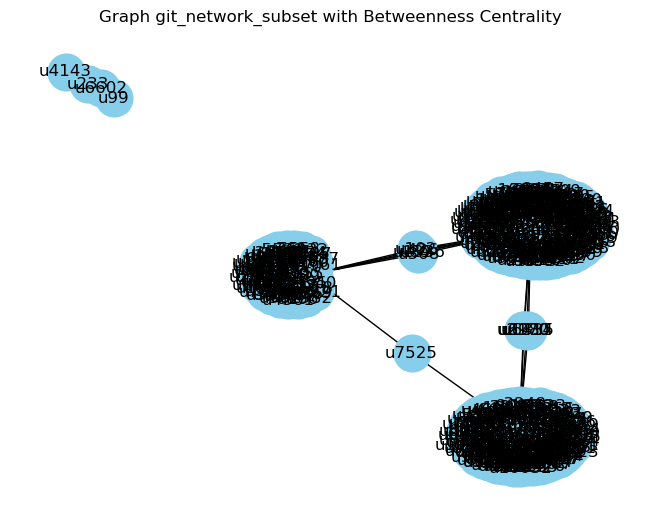

In [44]:
# I can also plot this 
import networkx as nx
import matplotlib.pyplot as plt

# Making a graph as before. 
git_network_subset = nx.Graph()
git_network_subset.add_edges_from(subset_from_git)

# Getting betweenness centrality 
betweenness_centrality = nx.betweenness_centrality(git_network_subset)

# Plot the graph
pos = nx.spring_layout(git_network_subset)
nx.draw(git_network_subset, pos, with_labels=True, node_size=700, node_color='skyblue')
plt.title('Graph git_network_subset with Betweenness Centrality')
plt.show()

Looks like the user 7525 has a very high betweenness centrality. While it is hard to see the overlapping users in the other section, it does reveal that the majority of users have connections with only a handful of major repos. Additionally, there are also outliers that don't have any connections with others. 

### 7. Plot the Matrix, Arc and Circos from the subset.

#### 7.1 Plotting the Matrix 

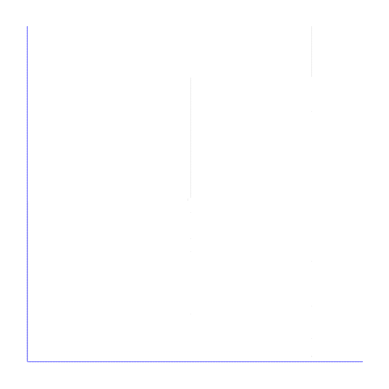

In [50]:
#Now the same but with the subset from twitter data.
import nxviz as nv
nv.MatrixPlot(git_sub)
plt.show()

#### 7.2 Plotting the Arc

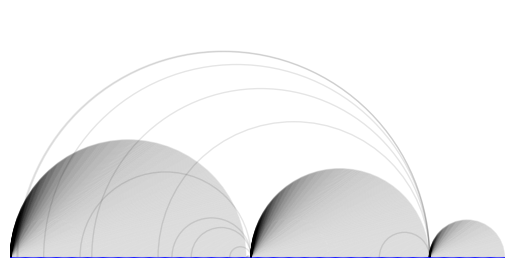

In [51]:
nv.ArcPlot(git_sub)
plt.show()

#### 7.3 Plotting the Circos

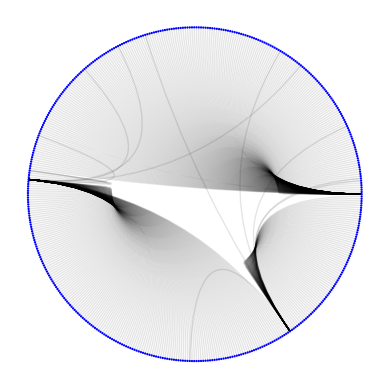

In [52]:
nv.CircosPlot(git_sub)
plt.show()

These graphs reflect that there are three major git users that most users have interactions with. 

# Challenge 2

This challenge is about OSMnx. You will explore and analyze a city's street network using the OSMnx Python library.

1. Use OSMnx to download the street network of a city of your choice. You can specify the city name, BBox or a Dict.
2. Calculate basic statistics for the street network, such as the number of nodes, edges, average node degree, etc.
3. Use OSMnx to plot the street network. Customize the plot to make it visually appealing, including node size, edge color. See the potential options here: https://osmnx.readthedocs.io/en/stable/user-reference.html#module-osmnx.plot
4. Utilize the routing capabilities of OSMnx to find the shortest path between two points in the street network. Plot the route on top of the street network.
5. Calculate the centrality measures (e.g., degree centrality and betweenness_centrality) for nodes in the street network.
6. Create the figure-groud from the selected city
7. Create interactive maps to plot nodes, edges, nodes+edges and one of the centrality measures.
8. Export the street network to a GeoPackage (.gpkg) file. Ensure that the exported file contains both node and edge attributes. Demonstrate that the new GeoPackage can be used and read in Python using any of the libraries we have seen in the class to create a simple and interactive map.
9. Finally, use OSMnx to extract other urban elements (e.g., buildings, parks) and plot them.

## 1. Using OSMnx: Dublin 
Use OSMnx to download the street network of a city of your choice. You can specify the city name, BBox or a Dict.

/Users/Isaiah/miniforge3/envs/ua/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/Isaiah/miniforge3/envs/ua/lib/python3.10/site-packages/shapely/set_operations.py:340: RuntimeWarning: invalid value encountered in union
  return lib.union(a, b, **kwargs)
/Users/Isaiah/miniforge3/envs/ua/lib/python3.10/site-packages/shapely/set_operations.py:340: RuntimeWarning: invalid value encountered in union
  return lib.union(a, b, **kwargs)


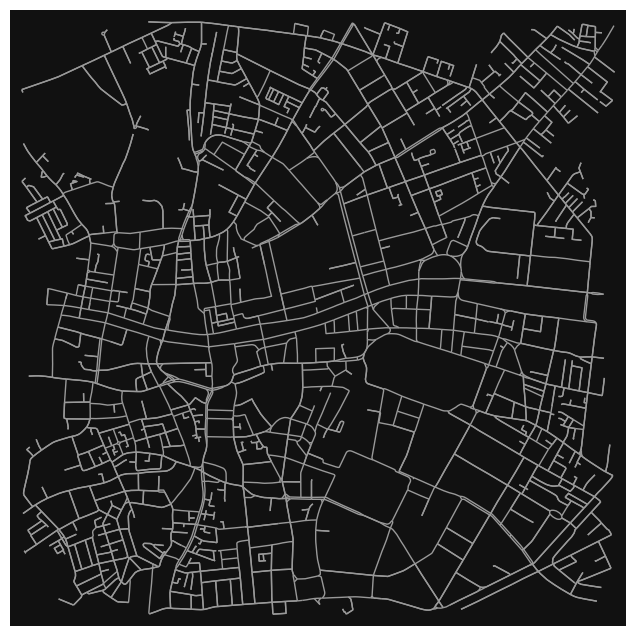

In [55]:
# I'd like to see the street networks in Dublin's city centre, so I've chosen a one_mile range from the Ha'Penny bridge. 
import osmnx as ox
dublin_city_centre = (53.346400, -6.263143)
one_mile = 1609.34  # meters
G_dub = ox.graph_from_point(dublin_city_centre, dist=one_mile, network_type="drive") 
fig, ax = ox.plot_graph(G_dub, node_size=0)

In [57]:
# Conversion to a gdf
import warnings
warnings.simplefilter('ignore', DeprecationWarning)

# Using graph to gdfs
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G_dub)
# Now there are two separate dataframes that have the edges and the nodes. 

## 2. Calculating Basic Statistics 
Includes number of nodes, edges, average node degree, and so on. 

In [60]:
# Finding the area in meters of the map 
warnings.filterwarnings('ignore')
G_dub_proj = ox.project_graph(G_dub)
nodes_proj = ox.graph_to_gdfs(G_dub_proj, edges=False)
graph_area_m = nodes_proj.unary_union.convex_hull.area
graph_area_m

10084275.785081936

In [63]:
# Basic statistics of the map 
ox.basic_stats(G_dub_proj, area=graph_area_m, clean_int_tol=15)

{'n': 1619,
 'm': 3548,
 'k_avg': 4.3829524397776405,
 'edge_length_total': 255836.74,
 'edge_length_avg': 72.10731116121758,
 'streets_per_node_avg': 2.7220506485484868,
 'streets_per_node_counts': {0: 0, 1: 318, 2: 30, 3: 1066, 4: 196, 5: 7, 6: 2},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.19641754169240272,
  2: 0.01852995676343422,
  3: 0.6584311303273626,
  4: 0.12106238418777023,
  5: 0.004323656578134651,
  6: 0.0012353304508956147},
 'intersection_count': 1301,
 'street_length_total': 157563.28599999985,
 'street_segment_count': 2159,
 'street_length_avg': 72.97975266326996,
 'circuity_avg': 1.0309103766485777,
 'self_loop_proportion': 0.0018527095877721167,
 'clean_intersection_count': 971,
 'node_density_km': 160.5469777408359,
 'intersection_density_km': 129.012735046836,
 'edge_density_km': 25369.867450319965,
 'street_density_km': 15624.650630151289,
 'clean_intersection_density_km': 96.28852093042104}

In [64]:
# Here, I can use .edges/.nodes and len() to print the number of nodes and edges; this is already included above with n and m, but this will make it extra clear. 
print(len(list(G_dub.edges)))
print(len(list(G_dub.nodes)))

3548
1619


## 3. Plotting the Street Network 
Use OSMnx to plot the street network. Customize the plot to make it visually appealing, including node size, edge color. 
https://osmnx.readthedocs.io/en/stable/user-reference.html#module-osmnx.plot 

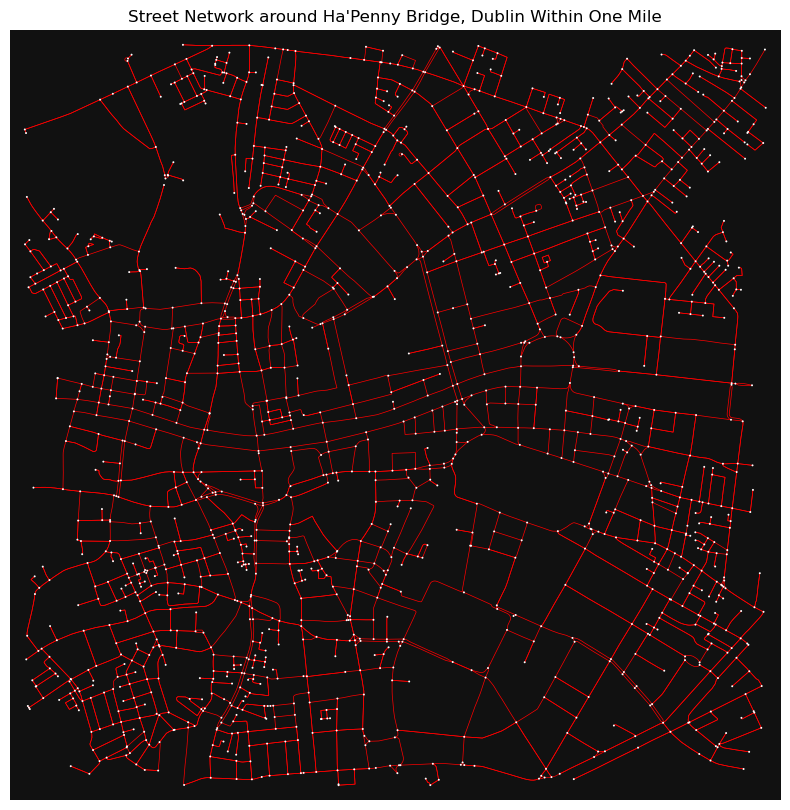

In [65]:
# Customizing the plot using matplotlib
fig, ax = ox.plot_graph(G_dub,
                         figsize=(10, 10),  # Adjusting figure size 
                         node_size=2,  # Increased the node size to 2 
                         edge_color="red",  # Made all the edges red for contrast
                         edge_linewidth=0.5,  # Made all the edges 0.5 thickness 
                         show=False)  # I'd like to add a title later. 

plt.title("Street Network around Ha'Penny Bridge, Dublin Within One Mile")  # Adding a title

plt.show()  # Displaying the plot

## 4. Shortest Route 
Utilize the routing capabilities of OSMnx to find the shortest path between two points in the street network. Plot the route on top of the street network.


From a visit to Dublin, I'd like to know the shortest route to take from the national gallery of Ireland and the entrance to a park called Croppy Acre. I found these using bbox. 
1. Coordinates for National Gallery (-6.252697,53.340813) 
2. Coordinates for Croppy Acre Park (-6.285219,53.347810)

In [66]:
# Using add_edge_speeds and travel times
G_dub = ox.speed.add_edge_speeds(G_dub)
G_dub = ox.speed.add_edge_travel_times(G_dub)

In [67]:
# getting the nearest network nodes to two lat/lng points with the distance module
orig = ox.distance.nearest_nodes(G_dub, X=-6.252697, Y=53.340813) # National Gallery 
dest = ox.distance.nearest_nodes(G_dub, X=-6.285219, Y=53.347810) # Croppy Acre Park

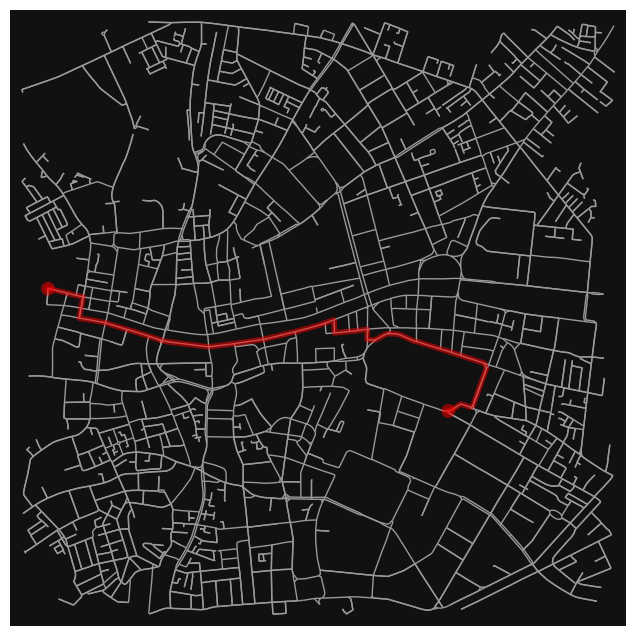

In [68]:
# finding the shortest path between nodes, minimizing travel time, then plotting it
route = ox.shortest_path(G_dub, orig, dest, weight="travel_time")
fig, ax = ox.plot_graph_route(G_dub, route, node_size=0)

## 5. Centrality Measures
Calculate the centrality measures (e.g., degree centrality and betweenness_centrality) for nodes in the street network.

### 5.1 Visualising Closeness Centrality 

In [69]:
# converting the graph to line graph so edges become nodes and vice versa
edge_centrality = nx.closeness_centrality(nx.line_graph(G_dub))
nx.set_edge_attributes(G_dub, edge_centrality, "edge_centrality")

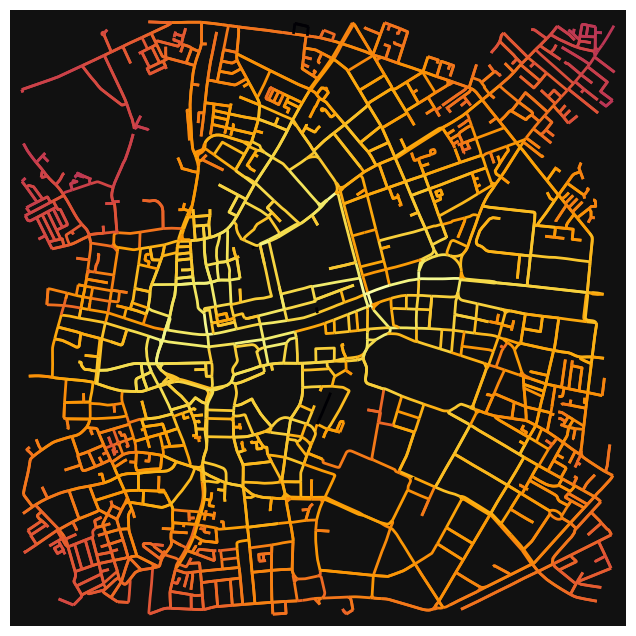

In [70]:
# coloring the edges in original graph with closeness centralities from line graph
ec = ox.plot.get_edge_colors_by_attr(G_dub, "edge_centrality", cmap="inferno")
fig, ax = ox.plot_graph(G_dub, edge_color=ec, edge_linewidth=2, node_size=0)

### 5.2 Calculating Betweenness Centrality 

In [71]:
import networkx as nx
import matplotlib.pyplot as plt

# This line here calculates the betweenness centrality for all the nodes in "G_dub" and stores them in a dictionary (called betweenness list)
betweenness_centrality = nx.betweenness_centrality(G_dub)

# Extracting betweenness_centrality values as a list
betweenness_list = list(betweenness_centrality.values())

# Print the betweenness centrality list
#print(betweenness_list) # This outcome is quite long, as a note. 

### 5.3 Visualising Betweenness Centrality 

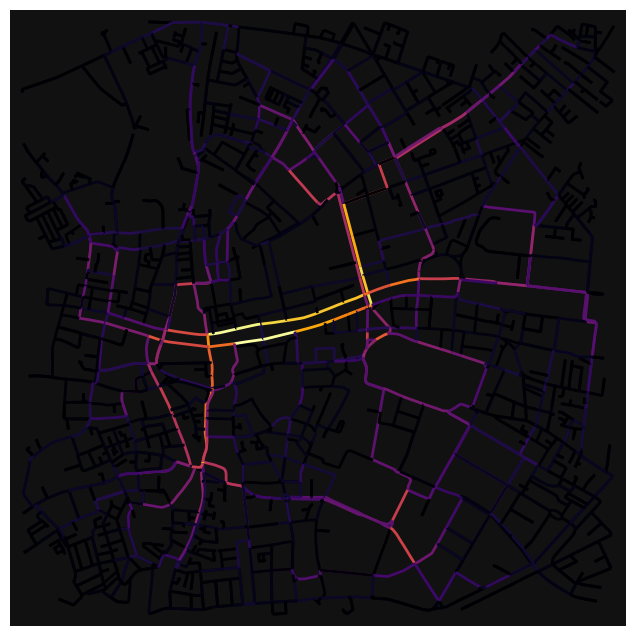

In [73]:
# converting the graph to line graph so edges become nodes and vice versa
betweenness_centrality = nx.betweenness_centrality(nx.line_graph(G_dub))
nx.set_edge_attributes(G_dub, betweenness_centrality, "betweenness_centrality")
# coloring the edges in original graph with betweenness centralities from line graph
ec = ox.plot.get_edge_colors_by_attr(G_dub, "betweenness_centrality", cmap="inferno")
fig, ax = ox.plot_graph(G_dub, edge_color=ec, edge_linewidth=2, node_size=0)

### 5.4 Calculating Degree Centrality

In [74]:
import networkx as nx
import matplotlib.pyplot as plt

# This line here calculates the degree centrality for all the nodes in "G_dub" and stores them in a dictionary (called degree-centrality)
degree_centrality = nx.degree_centrality(G_dub)

# Extracting degree centrality values as a list
centrality_list = list(degree_centrality.values())

# Print the degree centrality list
print(centrality_list) # This outcome is quite long, as a note. 

[0.002472187886279357, 0.003090234857849196, 0.0037082818294190355, 0.002472187886279357, 0.002472187886279357, 0.003090234857849196, 0.0037082818294190355, 0.0018541409147095178, 0.002472187886279357, 0.003090234857849196, 0.0018541409147095178, 0.0037082818294190355, 0.004326328800988875, 0.0037082818294190355, 0.0018541409147095178, 0.0037082818294190355, 0.004326328800988875, 0.0037082818294190355, 0.0006180469715698393, 0.0018541409147095178, 0.003090234857849196, 0.0037082818294190355, 0.004944375772558714, 0.003090234857849196, 0.002472187886279357, 0.0018541409147095178, 0.0018541409147095178, 0.002472187886279357, 0.0037082818294190355, 0.0037082818294190355, 0.002472187886279357, 0.0037082818294190355, 0.0037082818294190355, 0.0037082818294190355, 0.0037082818294190355, 0.004326328800988875, 0.0037082818294190355, 0.0037082818294190355, 0.0037082818294190355, 0.0037082818294190355, 0.0018541409147095178, 0.0006180469715698393, 0.002472187886279357, 0.0018541409147095178, 0.00

### 5.5 Visualising Degree Centrality

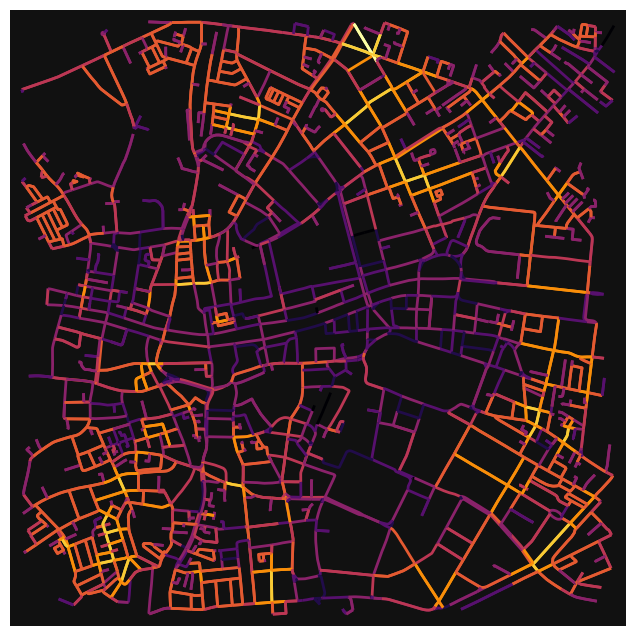

In [75]:
# converting the graph to line graph so edges become nodes and vice versa
degree_centrality = nx.degree_centrality(nx.line_graph(G_dub))
nx.set_edge_attributes(G_dub, degree_centrality, "degree_centrality")
# coloring the edges in original graph with degree centralities from line graph
ec = ox.plot.get_edge_colors_by_attr(G_dub, "degree_centrality", cmap="inferno")
fig, ax = ox.plot_graph(G_dub, edge_color=ec, edge_linewidth=2, node_size=0)

## 6. Figure_ground 
 Create the figure-ground from the selected city

In [78]:
from IPython.display import Image
# configure the inline image display
img_folder = "images"
extension = "png"
size = 300
dpi = 40

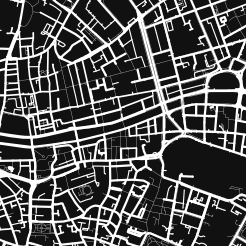

In [79]:
street_widths = { # Assigning the widths of edges based on attribute 
    "footway": 0.5,
    "steps": 0.5,
    "pedestrian": 0.5,
    "path": 0.5,
    "track": 0.5,
    "service": 2,
    "residential": 3,
    "primary": 5,
    "motorway": 6,
}
place = "dublin"
point = (53.346400, -6.263143)
fp = f"./{img_folder}/{place}.{extension}"
fig, ax = ox.plot_figure_ground(
    point=point,
    filepath=fp,
    network_type="all",
    street_widths=street_widths,
    dpi=dpi,
    save=True,
    show=False,
    close=True,
)
Image(fp, height=size, width=size)

## 7. Interactive Mapping 
 Create interactive maps to plot nodes, edges, nodes+edges and one of the centrality measures.

### 7.1 Interactive Mapping: Nodes 

In [81]:
# explore graph nodes interactively, with different basemap tiles
nodes = ox.graph_to_gdfs(G_dub, edges=False)
nodes.explore(tiles="cartodbpositron", marker_kwds={"radius": 8})

### 7.2 Edges 

In [84]:
# explore graph edges interactively, with a simple one-liner
ox.graph_to_gdfs(G_dub, nodes=False).explore()

### 7.3 Nodes and Edges 

In [82]:
# explore nodes and edges together in a single map
nodes, edges = ox.graph_to_gdfs(G_dub)
m = edges.explore(color="skyblue", tiles="cartodbdarkmatter")
nodes.explore(m=m, color="yellow", marker_kwds={"radius": 6})

### 7.4 Betweenness Centrality Measure 

In [87]:
# explore graph nodes interactively, colored by betweenness centrality
nx.set_node_attributes(G_dub, nx.betweenness_centrality(G_dub, weight="length"), name="bc")
nodes = ox.graph_to_gdfs(G_dub, edges=False)
nodes.explore(tiles="cartodbdarkmatter", column="bc", marker_kwds={"radius": 8})

This is interesting; it seems as though the nodes with the highest betweenness centrality are near the bridges; this makes sense because these are the only points where one can cross te river that flows through Dublin. The slightly more residential areas have a lower betweenness centrality.

## 8. Exporting to a .gpkg
Export the street network to a GeoPackage (.gpkg) file. Ensure that the exported file contains both node and edge attributes. Demonstrate that the new GeoPackage can be used and read in Python using any of the libraries we have seen in the class to create a simple and interactive map.

In [89]:
# Save graph to disk as geopackage (for GIS)
ox.save_graph_geopackage(G_dub, filepath="data/dublinnetwork.gpkg")

In [90]:
import geopandas as gpd

# Read the GeoPackage file into a GeoDataFrame
gdf_nodes, gdf_edges = gpd.read_file("data/dublinnetwork.gpkg", layer="nodes"), gpd.read_file("data/dublinnetwork.gpkg", layer="edges")

In [91]:
# Mapping both the edges and the nodes into one map using .explore
m = gdf_edges.explore(color="red", tiles="cartodbdarkmatter")
gdf_nodes.explore(m=m, color="skyblue", marker_kwds={"radius": 6})

## 9. Extracting urban elements 
Finally, use OSMnx to extract other urban elements (e.g., buildings, parks) and plot them.


Is a Python package to download, model, analyze, and visualize street networks and other geospatial features from OpenStreetMap. You can download and model walking, driving, or biking networks with a single line of code then easily analyze and visualize them. You can just as easily work with urban amenities/points of interest, building footprints, transit stops, elevation data, street orientations, speed/travel time, and routing.[1]
get all building footprints in some neighborhood
[1]:https://geoffboeing.com/2016/11/osmnx-python-street-networks/

/var/folders/js/8c8thlvx6rvdx2vhswmdbvjh0000gp/T/ipykernel_81299/2230802022.py:11: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release.
  building_footprints = ox.geometries_from_point(
/Users/Isaiah/miniforge3/envs/ua/lib/python3.10/site-packages/shapely/set_operations.py:340: RuntimeWarning: invalid value encountered in union
  return lib.union(a, b, **kwargs)
/Users/Isaiah/miniforge3/envs/ua/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/Isaiah/miniforge3/envs/ua/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/Isaiah/miniforge3/envs/ua/lib/python3.10/site

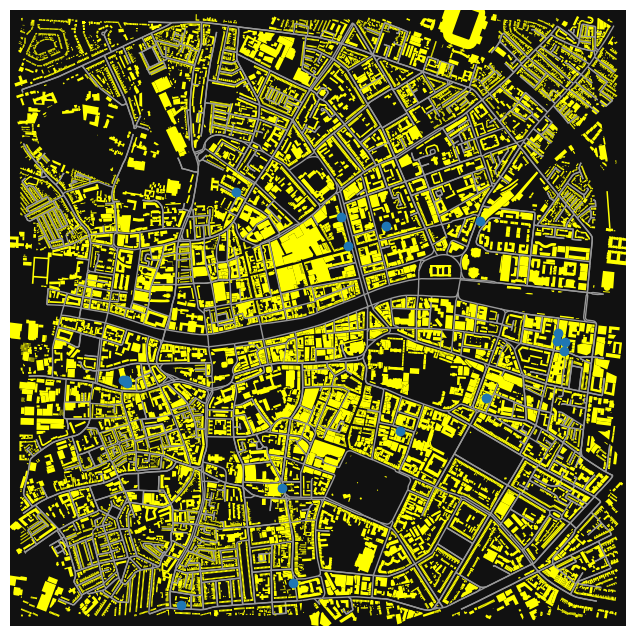

In [94]:
# Let's try for the buildings 
import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt

# Defining the point of interest (ie ha'penny bridge)
dublin_city_centre = (53.346400, -6.263143)
one_mile = 1609.34  # meters

# Extracting the building footprints within the one mile location of the ha'penny bridge
building_footprints = ox.geometries_from_point(
    dublin_city_centre,
    tags={"building": True},
    dist=one_mile,
)

# Plotting the road network graph
G_dub = ox.graph_from_point(dublin_city_centre, dist=one_mile, network_type="drive")
fig, ax = ox.plot_graph(G_dub, node_size=0, show=False)

# Plotting the building footprints using .plot
building_footprints.plot(ax=ax, facecolor='yellow', alpha=1) # Changed the color and the opacity

# Show the plot
plt.show()